In [1]:
import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
import scanpy as sc
# import torch
import matplotlib.pyplot as plt
import numpy as np
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
import pandas as pd
pd.set_option('display.max_columns', None) 
import anndata as ad

In [2]:
adata = sc.read_h5ad('workspace/hpca/hpca_downstream/julia_concat_objects_new/T1D_T2D_aab_core_2705.h5ad')

In [9]:
adata.obs['Dataset_Source'] = adata.obs['Dataset'].astype(str) + '_' + adata.obs['source'].astype(str)
adata.obs['Dataset_ID'] = adata.obs["Dataset_Source"].astype(str) + ' : ' + adata.obs['donor_id'].astype(str)
adata.obs.groupby('Dataset_Source')['Dataset_ID'].nunique()

Dataset_Source
GSE101207_remapped_core               6
GSE114297_remapped_core              12
GSE150724_core                        3
GSE183568_core                        5
GSE198623_core                        5
GSE251913_T2D_extension               2
GSE84133_remapped_core                4
HPAP_T1D_extension                   10
HPAP_T2D_extension                   17
HPAP_aab_extension                   11
HPAP_core                            27
Jimenez_T1D_extension                16
Jimenez_aab_extension                10
Jimenez_core                         11
Karakose_core                         6
Tabula_Sapiens_core                   2
charite_snRNA_core                    3
espace_scRNA_cultured_islets_core     5
espace_snRNA_adult_whole_core        16
espace_snRNA_frozen_islets_core       4
Name: Dataset_ID, dtype: int64

In [10]:
adata

AnnData object with n_obs × n_vars = 1086688 × 36805
    obs: 'barcode', 'Dataset', 'ID', 'sample_id', 'donor_id', 'alignment_software', 'assay_ontology_term_id', 'institute', 'library_id', 'library_preparation_batch', 'library_sequencing_run', 'Manual_Annotation', 'cell_enrichment', 'condition', 'celltype_all', 'manner_of_death', 'reference_genome', 'sample_collection_method', 'sample_source', 'sampled_site_condition', 'samples', 'sex', 'sex--cell_ontology_term_id', 'suspension_type', 'technology', 'tissue_type', 'assay', 'tissue', 'organism', 'disease', 'gene_annotation_version', 'batch_covar_split', 'batch_covar_split_donor_id', 'batch_covariate', 'info_batch_covariate_split', 'doublet_score', 'predicted_doublet', 'n_genes', 'total_counts', 'total_counts_mito', 'total_counts_ribo', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mito', 'log1p_total_counts_ribo', 'n_genes_by_counts', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top

In [ ]:
# for dataset in adata.obs['Dataset_Source'].unique():
#     print('-'*100)
#     adata_subset = adata[adata.obs['Dataset_Source'] == dataset]
#     print(f'{dataset}:  X: {adata_subset.X.max()}, counts: {adata_subset.layers["counts"].max()}, normcounts: {adata_subset.layers["normcounts"].max()}')
# del adata.layers['normcounts']
# # del adata.layers['lognorm']
# sc.pp.normalize_total(adata, target_sum=1e4)
# sc.pp.log1p(adata)

In [13]:
for dataset in adata.obs['Dataset_Source'].unique():
    print('-'*100)
    adata_subset = adata[adata.obs['Dataset_Source'] == dataset]
    print(f'{dataset}:  X: {adata_subset.X.max()}, counts: {adata_subset.layers["counts"].max()}')


----------------------------------------------------------------------------------------------------
GSE101207_remapped_core:  X: 8.732156667691612, counts: 1284.0
----------------------------------------------------------------------------------------------------
GSE198623_core:  X: 9.015033032981144, counts: 32598.0
----------------------------------------------------------------------------------------------------
GSE84133_remapped_core:  X: 6.522902943729061, counts: 126.0
----------------------------------------------------------------------------------------------------
GSE183568_core:  X: 9.01118669921518, counts: 14714.0
----------------------------------------------------------------------------------------------------
Karakose_core:  X: 9.165641671702248, counts: 35606.0
----------------------------------------------------------------------------------------------------
Tabula_Sapiens_core:  X: 8.942755552488476, counts: 79058.0
-----------------------------------------------

# Define Cell States

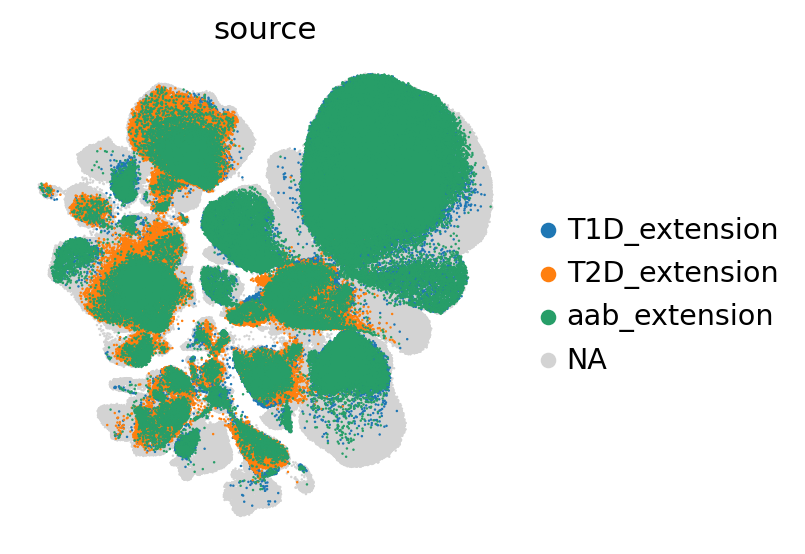

In [14]:
sc.pl.umap(
    adata,
    color=["source"], frameon=False,
    na_color="lightgrey", ncols=2, size=5, groups=['T1D_extension', 'T2D_extension', 'aab_extension'])

In [15]:
core = adata[adata.obs["source"] == "core"].copy()
level_map = (
    core.obs
    .dropna(subset=["Level_3", "Level_4"])
    .drop_duplicates(subset=["Level_4"])
    .set_index("Level_4")["Level_3"]
    .to_dict()
)

adata.obs["Level_3_extension"] = adata.obs["Level_4_extension"].map(level_map)

In [16]:
adata

AnnData object with n_obs × n_vars = 1086688 × 36805
    obs: 'barcode', 'Dataset', 'ID', 'sample_id', 'donor_id', 'alignment_software', 'assay_ontology_term_id', 'institute', 'library_id', 'library_preparation_batch', 'library_sequencing_run', 'Manual_Annotation', 'cell_enrichment', 'condition', 'celltype_all', 'manner_of_death', 'reference_genome', 'sample_collection_method', 'sample_source', 'sampled_site_condition', 'samples', 'sex', 'sex--cell_ontology_term_id', 'suspension_type', 'technology', 'tissue_type', 'assay', 'tissue', 'organism', 'disease', 'gene_annotation_version', 'batch_covar_split', 'batch_covar_split_donor_id', 'batch_covariate', 'info_batch_covariate_split', 'doublet_score', 'predicted_doublet', 'n_genes', 'total_counts', 'total_counts_mito', 'total_counts_ribo', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mito', 'log1p_total_counts_ribo', 'n_genes_by_counts', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top

In [17]:
adata.obs.Level_4_extension.isna().sum()

np.int64(0)

In [18]:
adata.obs.groupby(['source', 'Level_3_extension']).size().unstack().T

source,T1D_extension,T2D_extension,aab_extension,core
Level_3_extension,,,,
Acinar Cell,73623,12003,65603,416161
Adipocyte,11,0,8,539
Alpha Cell,10617,19251,8003,105249
Beta Cell,1605,14135,10550,82668
Delta Cell,608,1778,530,14739
Ductal Cell,14572,5490,12606,122194
Endothelial Cell,1540,2119,1014,14857
Epsilon Cell,31,38,24,877
Fibroblast,19,30,38,8071


In [19]:
adata.obs.groupby(['source', 'Level_4_extension']).size().unstack().T.sort_values(by='aab_extension', ascending=False)

source,T1D_extension,T2D_extension,aab_extension,core
Level_4_extension,,,,
Acinar Cell: Idling,38481,51,37831,190817
Acinar Cell: Interferon Response,5257,824,6776,36305
Ductal Cell,4357,127,5713,12471
Beta Cell: INS_High,476,5525,5164,18556
Acinar Cell: Transitional,11788,7439,3882,17038
...,...,...,...,...
T Cell: CM CD4+,0,0,0,110
T Cell: EM CD4+,0,0,0,109
Treg: Activated,0,0,0,92


In [20]:
adata.obs['source'].value_counts()

source
core             815126
T1D_extension    107241
aab_extension    102173
T2D_extension     62148
Name: count, dtype: int64

In [21]:
adata.obs['Dataset_Source'].value_counts().sort_index(key=lambda x: x.str.split('_').str[-1])

Dataset_Source
espace_snRNA_adult_whole_core        381657
GSE150724_core                        12327
GSE101207_remapped_core               14043
espace_snRNA_frozen_islets_core       15137
GSE114297_remapped_core               20351
GSE198623_core                        23871
Karakose_core                         30014
Tabula_Sapiens_core                    7345
espace_scRNA_cultured_islets_core     36943
GSE183568_core                        49849
HPAP_core                             61879
charite_snRNA_core                    64361
Jimenez_core                          90622
GSE84133_remapped_core                 6727
HPAP_T2D_extension                    43372
HPAP_aab_extension                    29313
GSE251913_T2D_extension               18776
Jimenez_T1D_extension                 67614
Jimenez_aab_extension                 72860
HPAP_T1D_extension                    39627
Name: count, dtype: int64

In [22]:
prob_cols = [
    i.decode().replace("b'", "") if isinstance(i, bytes)
    else str(i).replace("b'", "")
    for i in adata.uns["scanvi_prediction_prob_columns"]
]

probs = pd.DataFrame(
    adata.obsm["scanvi_prediction_probabilities"],
    index=adata.obs_names,
    columns=prob_cols
)
probs["Dataset_Source"] = adata.obs["Dataset_Source"].values

level_3_map = {c: c.split(":")[0].strip() if ":" in c else c for c in prob_cols}
level_3_map = {k: "T Cell" if v == "Treg" else v for k, v in level_3_map.items()}

In [23]:
def compute_level3_probs_and_confidence(probs_sub, prob_cols, level_3_map):
    probs_level3 = probs_sub[prob_cols].groupby(level_3_map, axis=1).sum().copy()
    level_3_cols = probs_level3.columns.tolist()

    P_l3 = probs_level3.clip(lower=1e-12, upper=1.0)
    probs_level3["l3_max"] = P_l3.max(axis=1)
    probs_level3["l3_max_ct"] = P_l3.idxmax(axis=1)
    probs_level3["l3_entropy"] = -(P_l3[level_3_cols] * np.log(P_l3[level_3_cols])).sum(axis=1)
    probs_level3["l3_entropy_norm"] = probs_level3["l3_entropy"] / np.log(len(level_3_cols))
    probs_level3["Dataset_Source"] = probs_sub["Dataset_Source"]

    return probs_level3

def identify_candidate_state_cells(
    adata,
    probs_sub,
    probs_level3_sub,
    prob_cols,
    cell_type,
    l3_thresh=0.7,
    uncertainty_quantile=0.75,
    total_prob_thresh=0.7,
    hard_label_col="Level_4_extension",
):
    # confident Level 3 cells
    l3_cells = probs_level3_sub.index[
        (probs_level3_sub["l3_max_ct"] == cell_type) &
        (probs_level3_sub["l3_max"] > l3_thresh)
    ]

    # Level 4 columns for this lineage
    lineage_prob_cols = [c for c in prob_cols if cell_type in c]
    if len(lineage_prob_cols) < 2:
        raise ValueError(f"Not enough Level 4 columns found for {cell_type}: {lineage_prob_cols}")

    # subset Level 4 lineage probs
    df = probs_sub.loc[l3_cells, lineage_prob_cols].copy()
    df[f"{cell_type}_total_prob"] = df.sum(axis=1)

    # renormalize within lineage
    P = df[lineage_prob_cols].clip(lower=1e-12, upper=1.0)
    row_sums = P.sum(axis=1).replace(0, np.nan)
    P = P.div(row_sums, axis=0)

    valid = ~P.isna().any(axis=1)
    P = P.loc[valid]
    df = df.loc[valid]

    # uncertainty metrics
    prefix = cell_type.lower().replace(" ", "_")

    df[f"{prefix}_pred_max"] = P.max(axis=1)
    df[f"{prefix}_pred_top_state"] = P.idxmax(axis=1)
    df[f"{prefix}_pred_entropy"] = -(P * np.log(P)).sum(axis=1)
    df[f"{prefix}_pred_entropy_norm"] = df[f"{prefix}_pred_entropy"] / np.log(len(lineage_prob_cols))

    P_sorted = np.sort(P.values, axis=1)
    df[f"{prefix}_pred_margin"] = P_sorted[:, -1] - P_sorted[:, -2]

    df[f"{prefix}_scanvi_uncertainty_score"] = (
        df[f"{prefix}_pred_entropy_norm"] +
        (1 - df[f"{prefix}_pred_max"]) +
        (1 - df[f"{prefix}_pred_margin"])
    ) / 3

    # add L3 information back
    df = df.join(
        probs_level3_sub.loc[
            df.index,
            ["l3_max", "l3_max_ct", "l3_entropy", "l3_entropy_norm", "Dataset_Source"]
        ],
        how="left"
    )

    # threshold
    thr = df[f"{prefix}_scanvi_uncertainty_score"].quantile(uncertainty_quantile)

    candidate_cells = df.index[
        (df[f"{prefix}_scanvi_uncertainty_score"] >= thr) &
        (df[f"{cell_type}_total_prob"] > total_prob_thresh)
    ]

    # optional hard-label tightening
    candidate_cells = [
        c for c in candidate_cells
        if cell_type in str(adata.obs.loc[c, hard_label_col])
    ]

    return df, candidate_cells, thr


In [24]:
adata.obs.head()

,barcode,Dataset,ID,sample_id,donor_id,alignment_software,assay_ontology_term_id,institute,library_id,library_preparation_batch,library_sequencing_run,Manual_Annotation,cell_enrichment,condition,celltype_all,manner_of_death,reference_genome,sample_collection_method,sample_source,sampled_site_condition,samples,sex,sex--cell_ontology_term_id,suspension_type,technology,tissue_type,assay,tissue,organism,disease,gene_annotation_version,batch_covar_split,batch_covar_split_donor_id,batch_covariate,info_batch_covariate_split,doublet_score,predicted_doublet,n_genes,total_counts,total_counts_mito,total_counts_ribo,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,log1p_total_counts_ribo,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,pct_counts_mito,pct_counts_ribo,outlier,outlier_mito,outlier_n_genes,outlier_total_counts,Author_Annotation,Cell_Annotation_Merged,Cell_Type_Harmonized,GSE183568_Annotation,GSE198623_Annotation,GSE84133_Annotation,HPAP_Annotation,charite_snRNA_Annotation,espace_Annotation,leiden_1,leiden_2,leiden_3,leiden_3.5,leiden_4,leiden_3_subclustered,leiden_3_subclustered_immune,Annotation_CAP,ANNOTATION_CARLOTTI,annotation_sterr,Annotation_Vandenbempt_Balboa,Level_1,Level_2,Level_3,Level_4,Level_4_refined,Level_4_refined_desc,Level_4_refined_Dataset,Level_4_refined_desc_Dataset,Level_4_refined_QC_sterr,Integration_Levels,acinar_ambient_expression_score,acinar_ambient_high,beta_ambient_expression_score,beta_ambient_high,alpha_ambient_expression_score,alpha_ambient_high,high_ambient_rna,acinar_identity_score,ductal_identity_score,acinar_ductal_axis,high_mt_sterr,low_genes_sterr,low_complexity_sterr,donor_entropy_scaled,donor_entropy_leiden,dataset_entropy_scaled,dataset_entropy_leiden,alpha_identity_score,beta_identity_score,Level_4_redone,cell_states,cell_states_l4,batch_covar_final,ARX_expr,GLIS3_expr,ARX_top10,GLIS3_top10,Field,donor_id_meta,protocol_url,institute_meta,sample_collection_site,sample_collection_relative_time_point,library_id_meta,library_id_repository,author_batch_notes,organism_ontology_term_id,manner_of_death_meta,sample_source_meta,sex_ontology_term_id,sample_collection_method_meta,tissue_type_meta,sampled_site_condition_meta,tissue_ontology_term_id,tissue_free_text,sample_preservation_method,suspension_type_meta,cell_enrichment_meta,cell_viability_percentage,cell_number_loaded,sample_collection_year,assay_ontology_term_id_meta,library_preparation_batch_meta,library_sequencing_run_meta,sequenced_fragment,sequencing_platform,is_primary_data,reference_genome_meta,gene_annotation_version_meta,alignment_software_meta,intron_inclusion,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,development_stage_ontology_term_id,Dataset_meta,DCP_donor_id,DCP_sample_id,Unnamed: 4,sample_id_meta,integration team donor id,filename,project,dataset,donor_id_name,donor_id_description,sample_id_name,sample_id_description,library_id_repository_name,library_id_repository_description,sample_collection_biobank,manner_of_death_string,author_cell_type,cell_type_ontology_term_id,study,orig.ident,short_id,donor_type,region_id,region_name,slice_no,conservation,conservation_name,sample_receiver,method_id,method_name,age,age_unit,sex_meta,mapped_age_bin,BMI,BMI_category,HbA1c,age_from_hsapdv,ID_meta,n_counts,new_qc_passed,doublets,disease_status,_scvi_batch,_scvi_labels,source,Level_4_extension,predictions,prediction_confidence,prediction_uncertainty,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.1,seurat_clusters,RNA_snn_res.0.5,celltype_assignment1,SeuratClusters,celltype_assignment2,nPOD_barcode,CurrentObjLabels,nPOD_ID,nCount_RAW_mtx,nFeature_RAW_mtx,conditionSubtype,CellTypes,rough_cell_annotation,extension_donor_age,extension_donor_BMI,extension_donor_ancestry,extension_batch_tissuesource,extension_seq_modality,extension_severity_score,n_cells,median_n_genes,median_percent_mito,median_scrublet_score,pct_counts_in_

In [25]:
cell_types = [
    "Alpha Cell",
    "Beta Cell",
    "Delta Cell",
    "Pancreatic Polypeptide Cell",
]

disease_patterns = {
    "T1D": "T1D",
    "T2D": "T2D",
    "aab": "aab",
}

all_results = {}

for disease_name, disease_pattern in disease_patterns.items():
    print(f"\n===== Running {disease_name} =====")

    probs_sub = probs[probs["Dataset_Source"].str.contains(disease_pattern, na=False)].copy()
    # print(f"  Selected {len(probs_sub)} rows from probs for pattern '{disease_pattern}' (for {disease_name})")
    probs_level3_sub = compute_level3_probs_and_confidence(probs_sub, prob_cols, level_3_map)
    # print(f"  Level 3 probabilities and confidence computed for {probs_level3_sub.shape[0]} rows.")

    all_results[disease_name] = {}

    for ct in cell_types:
        # print(f"    Processing cell type: {ct}")
        df_ct, candidate_cells_ct, thr_ct = identify_candidate_state_cells(
            adata=adata,
            probs_sub=probs_sub,
            probs_level3_sub=probs_level3_sub,
            prob_cols=prob_cols,
            cell_type=ct,
            l3_thresh=0.8,
            uncertainty_quantile=0.75,
            total_prob_thresh=0.75,
            hard_label_col="Level_4_extension",
        )
        # print(f"      Threshold used (uncertainty score): {thr_ct:.4f}")
        # print(f"      DataFrame shape for {ct}: {df_ct.shape}")
        # print(f"      Number of candidate cells: {len(candidate_cells_ct)}")

        all_results[disease_name][ct] = {
            "df": df_ct,
            "candidate_cells": candidate_cells_ct,
            "threshold": thr_ct,
        }
        print(f"{disease_name} | {ct}: {len(candidate_cells_ct)} candidate cells")
   


===== Running T1D =====
T1D | Alpha Cell: 2646 candidate cells
T1D | Beta Cell: 396 candidate cells
T1D | Delta Cell: 146 candidate cells
T1D | Pancreatic Polypeptide Cell: 62 candidate cells

===== Running T2D =====
T2D | Alpha Cell: 4752 candidate cells
T2D | Beta Cell: 3410 candidate cells
T2D | Delta Cell: 407 candidate cells
T2D | Pancreatic Polypeptide Cell: 205 candidate cells

===== Running aab =====
aab | Alpha Cell: 1996 candidate cells
aab | Beta Cell: 2621 candidate cells
aab | Delta Cell: 125 candidate cells
aab | Pancreatic Polypeptide Cell: 63 candidate cells


In [26]:
adata.obs["disease_candidate_state"] = "No"
adata.obs["disease_candidate_label"] = np.nan
adata.obs["disease_candidate_cell_type"] = np.nan

for ct in cell_types:
    prefix = ct.lower().replace(" ", "_")
    adata.obs[f"{prefix}_uncertainty"] = np.nan

for disease_name in all_results:
    for ct in all_results[disease_name]:
        prefix = ct.lower().replace(" ", "_")
        df_ct = all_results[disease_name][ct]["df"]
        candidate_cells_ct = all_results[disease_name][ct]["candidate_cells"]

        # store uncertainty for all analyzed cells of this lineage+disease
        adata.obs.loc[df_ct.index, f"{prefix}_uncertainty"] = df_ct[f"{prefix}_scanvi_uncertainty_score"]

        # mark candidate cells
        adata.obs.loc[candidate_cells_ct, "disease_candidate_state"] = "Yes"
        adata.obs.loc[candidate_cells_ct, "disease_candidate_label"] = disease_name
        adata.obs.loc[candidate_cells_ct, "disease_candidate_cell_type"] = ct

In [27]:
adata.obs.head()

,barcode,Dataset,ID,sample_id,donor_id,alignment_software,assay_ontology_term_id,institute,library_id,library_preparation_batch,library_sequencing_run,Manual_Annotation,cell_enrichment,condition,celltype_all,manner_of_death,reference_genome,sample_collection_method,sample_source,sampled_site_condition,samples,sex,sex--cell_ontology_term_id,suspension_type,technology,tissue_type,assay,tissue,organism,disease,gene_annotation_version,batch_covar_split,batch_covar_split_donor_id,batch_covariate,info_batch_covariate_split,doublet_score,predicted_doublet,n_genes,total_counts,total_counts_mito,total_counts_ribo,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,log1p_total_counts_ribo,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,pct_counts_mito,pct_counts_ribo,outlier,outlier_mito,outlier_n_genes,outlier_total_counts,Author_Annotation,Cell_Annotation_Merged,Cell_Type_Harmonized,GSE183568_Annotation,GSE198623_Annotation,GSE84133_Annotation,HPAP_Annotation,charite_snRNA_Annotation,espace_Annotation,leiden_1,leiden_2,leiden_3,leiden_3.5,leiden_4,leiden_3_subclustered,leiden_3_subclustered_immune,Annotation_CAP,ANNOTATION_CARLOTTI,annotation_sterr,Annotation_Vandenbempt_Balboa,Level_1,Level_2,Level_3,Level_4,Level_4_refined,Level_4_refined_desc,Level_4_refined_Dataset,Level_4_refined_desc_Dataset,Level_4_refined_QC_sterr,Integration_Levels,acinar_ambient_expression_score,acinar_ambient_high,beta_ambient_expression_score,beta_ambient_high,alpha_ambient_expression_score,alpha_ambient_high,high_ambient_rna,acinar_identity_score,ductal_identity_score,acinar_ductal_axis,high_mt_sterr,low_genes_sterr,low_complexity_sterr,donor_entropy_scaled,donor_entropy_leiden,dataset_entropy_scaled,dataset_entropy_leiden,alpha_identity_score,beta_identity_score,Level_4_redone,cell_states,cell_states_l4,batch_covar_final,ARX_expr,GLIS3_expr,ARX_top10,GLIS3_top10,Field,donor_id_meta,protocol_url,institute_meta,sample_collection_site,sample_collection_relative_time_point,library_id_meta,library_id_repository,author_batch_notes,organism_ontology_term_id,manner_of_death_meta,sample_source_meta,sex_ontology_term_id,sample_collection_method_meta,tissue_type_meta,sampled_site_condition_meta,tissue_ontology_term_id,tissue_free_text,sample_preservation_method,suspension_type_meta,cell_enrichment_meta,cell_viability_percentage,cell_number_loaded,sample_collection_year,assay_ontology_term_id_meta,library_preparation_batch_meta,library_sequencing_run_meta,sequenced_fragment,sequencing_platform,is_primary_data,reference_genome_meta,gene_annotation_version_meta,alignment_software_meta,intron_inclusion,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,development_stage_ontology_term_id,Dataset_meta,DCP_donor_id,DCP_sample_id,Unnamed: 4,sample_id_meta,integration team donor id,filename,project,dataset,donor_id_name,donor_id_description,sample_id_name,sample_id_description,library_id_repository_name,library_id_repository_description,sample_collection_biobank,manner_of_death_string,author_cell_type,cell_type_ontology_term_id,study,orig.ident,short_id,donor_type,region_id,region_name,slice_no,conservation,conservation_name,sample_receiver,method_id,method_name,age,age_unit,sex_meta,mapped_age_bin,BMI,BMI_category,HbA1c,age_from_hsapdv,ID_meta,n_counts,new_qc_passed,doublets,disease_status,_scvi_batch,_scvi_labels,source,Level_4_extension,predictions,prediction_confidence,prediction_uncertainty,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.1,seurat_clusters,RNA_snn_res.0.5,celltype_assignment1,SeuratClusters,celltype_assignment2,nPOD_barcode,CurrentObjLabels,nPOD_ID,nCount_RAW_mtx,nFeature_RAW_mtx,conditionSubtype,CellTypes,rough_cell_annotation,extension_donor_age,extension_donor_BMI,extension_donor_ancestry,extension_batch_tissuesource,extension_seq_modality,extension_severity_score,n_cells,median_n_genes,median_percent_mito,median_scrublet_score,pct_counts_in_

In [28]:
mask = adata.obs["disease_candidate_state"] == "Yes"
adata.obs["Level_3_extension_diabetes"] = adata.obs["Level_3_extension"].astype(str).copy()
adata.obs["Level_4_extension_diabetes"] = adata.obs["Level_4_extension"].astype(str).copy()
adata.obs.loc[mask, "Level_3_extension_diabetes"] = (
    adata.obs.loc[mask, "Level_3_extension"].astype(str) +
    "_" +
    adata.obs.loc[mask, "disease_candidate_label"].astype(str)
)

adata.obs.loc[mask, "Level_4_extension_diabetes"] = (
    adata.obs.loc[mask, "Level_4_extension"].astype(str) +
    "_" +
    adata.obs.loc[mask, "disease_candidate_label"].astype(str)
)

print("\n===== Summary: disease candidate labels =====")
print(adata.obs["disease_candidate_label"].value_counts(dropna=False))

print("\n===== Summary: disease candidate cell types =====")
print(adata.obs["disease_candidate_cell_type"].value_counts(dropna=False))

print("\n===== Summary: extended Level 4 labels =====")
print(adata.obs.loc[mask, "Level_4_extension_diabetes"].value_counts().head(50))


===== Summary: disease candidate labels =====
disease_candidate_label
NaN    1069859
T2D       8774
aab       4805
T1D       3250
Name: count, dtype: int64

===== Summary: disease candidate cell types =====
disease_candidate_cell_type
NaN                            1069859
Alpha Cell                        9394
Beta Cell                         6427
Delta Cell                         678
Pancreatic Polypeptide Cell        330
Name: count, dtype: int64

===== Summary: extended Level 4 labels =====
Level_4_extension_diabetes
Alpha Cell: GCG_High_T2D                     1248
Alpha Cell: GCG_Mid_T2D                      1169
Beta Cell: INS_High_T2D                      1119
Beta Cell: INS_High_aab                      1095
Alpha Cell: GCG_Mid_T1D                       713
Alpha Cell: Interferon Response_T2D           587
Alpha Cell: GCG_High_T1D                      586
Alpha Cell: GCG_High_aab                      565
Alpha Cell: GCG_Mid_aab                       491
Alpha Cell: Oxidativ

In [29]:
all_results["T2D"]["Beta Cell"]["df"].sort_values(
    "beta_cell_scanvi_uncertainty_score", ascending=False
).head(5)

,Beta Cell: Dedifferentiation-like,Beta Cell: ER Stress,Beta Cell: High OxPhos,Beta Cell: INS_High,"Beta Cell: INS_High, IAPP_Low",Beta Cell: INS_Low,Beta Cell: INS_Mid,"Beta Cell: INS_Mid, IAPP_High",Beta Cell: Immediate Early Activation,Beta Cell: Interferon Response,Beta Cell: Ion Channel Activity,Beta Cell: Mature Identity,Beta Cell: Oxidative Stress,Beta Cell: Proliferating,Beta Cell: Secretory Granules,Beta Cell_total_prob,beta_cell_pred_max,beta_cell_pred_top_state,beta_cell_pred_entropy,beta_cell_pred_entropy_norm,beta_cell_pred_margin,beta_cell_scanvi_uncertainty_score,l3_max,l3_max_ct,l3_entropy,l3_entropy_norm,Dataset_Source
ATTCCATCACCGGTCA-1_0,0.002512,0.001873,0.011399,0.189292,0.001694,0.068036,0.173440,0.165385,0.047472,0.000336,0.119616,0.014523,0.000152,0.000005,0.194572,0.990307,0.196476,Beta Cell: Secretory Granules,1.980281,0.731257,0.005332,0.843150,0.990307,Beta Cell,0.056686,0.018619,GSE251913_T2D_extension
GACACGCAGAGTCACG-1_0,0.095834,0.004641,0.013434,0.161166,0.002935,0.005111,0.000663,0.133634,0.146785,0.001142,0.000978,0.002844,0.136213,0.000001,0.167535,0.872916,0.191925,Beta Cell: Secretory Granules,1.929994,0.712688,0.007296,0.837822,0.872916,Beta Cell,0.554617,0.182169,GSE251913_T2D_extension
AAGACTCTCTATACTC-1_0,0.098417,0.009448,0.016351,0.117080,0.000068,0.062644,0.038731,0.168056,0.025875,0.000314,0.011277,0.218564,0.002379,0.000004,0.204005,0.973214,0.224579,Beta Cell: Mature Identity,2.037341,0.752328,0.014960,0.837596,0.973214,Beta Cell,0.139193,0.045719,GSE251913_T2D_extension
CGGAGAAGTTATTCCT-1_0,0.143683,0.201615,0.041094,0.132485,0.002296,0.000138,0.002060,0.125785,0.006038,0.177876,0.000410,0.004402,0.005879,0.000280,0.149601,0.993642,0.202905,Beta Cell: ER Stress,1.977279,0.730149,0.023892,0.834450,0.993642,Beta Cell,0.047034,0.015449,GSE251913_T2D_extension
CGACAGCGTTTACACG-1_0,0.079656,0.000208,0.026729,0.204666,0.184051,0.000811,0.045113,0.113651,0.206043,0.007780,0.052538,0.002549,0.000613,0.000213,0.004605,0.929226,0.221736,Beta Cell: Immediate Early Activation,1.964195,0.725317,0.001481,0.834033,0.929226,Beta Cell,0.305769,0.100433,GSE251913_T2D_extension


In [30]:
all_results["T1D"]["Alpha Cell"]["df"].sort_values(
    "alpha_cell_scanvi_uncertainty_score", ascending=False
).head(5)

,Alpha Cell: Dedifferentiation-like,Alpha Cell: ER Stress,Alpha Cell: GCG_High,"Alpha Cell: GCG_High, IRX2_High",Alpha Cell: GCG_Low,"Alpha Cell: GCG_Low, POU6F2_High",Alpha Cell: GCG_Mid,Alpha Cell: High OxPhos,Alpha Cell: Interferon Response,Alpha Cell: Mature Identity,Alpha Cell: Oxidative Stress,Alpha Cell: Proliferating,Alpha Cell_total_prob,alpha_cell_pred_max,alpha_cell_pred_top_state,alpha_cell_pred_entropy,alpha_cell_pred_entropy_norm,alpha_cell_pred_margin,alpha_cell_scanvi_uncertainty_score,l3_max,l3_max_ct,l3_entropy,l3_entropy_norm,Dataset_Source
HPAP-064_GTGAGTTAGACCAGCA-1_1,0.022790,0.210395,0.020181,0.000102,0.108844,0.000052,0.215895,0.034321,0.195082,0.000141,0.101346,0.000299,0.909448,0.237392,Alpha Cell: GCG_Mid,1.814972,0.730399,0.006047,0.828987,0.909448,Alpha Cell,0.393575,0.129273,HPAP_T1D_extension
HPAP-087_TGAGGTTGTACGATTC-1_1,0.001353,0.009478,0.225122,0.000028,0.015064,0.000138,0.120255,0.025065,0.223982,0.244101,0.135189,0.000075,0.999850,0.244137,Alpha Cell: Mature Identity,1.751306,0.704777,0.018982,0.813886,0.999850,Alpha Cell,0.001628,0.000535,HPAP_T1D_extension
HPAP-071_CGTAGTATCGAGTCTA-1_1,0.079267,0.120509,0.012732,0.000034,0.177894,0.004245,0.075218,0.253624,0.014155,0.006970,0.211784,0.001877,0.958310,0.264657,Alpha Cell: High OxPhos,1.856738,0.747206,0.043660,0.812963,0.958310,Alpha Cell,0.222959,0.073233,HPAP_T1D_extension
HPAP-055_CTCCATGTCTGCCTGT-1_1,0.001942,0.187425,0.241237,0.000032,0.022639,0.000008,0.210566,0.204908,0.107812,0.001862,0.007743,0.012860,0.999034,0.241471,Alpha Cell: GCG_High,1.754231,0.705955,0.030701,0.811261,0.999035,Alpha Cell,0.008706,0.002860,HPAP_T1D_extension
HPAP-021_CCGTACTGTCCAGTGC-1_1,0.011126,0.145355,0.208430,0.000007,0.202943,0.000010,0.133130,0.015846,0.260317,0.000339,0.011733,0.010298,0.999535,0.260438,Alpha Cell: Interferon Response,1.767909,0.711459,0.051911,0.799703,0.999535,Alpha Cell,0.004613,0.001515,HPAP_T1D_extension


In [31]:
adata.obs['Disease_State'] = adata.obs['Dataset_Source'].str.extract(r'(T1D|T2D|aab)', expand=False)
adata.obs.Disease_State.value_counts()

Disease_State
T1D    107241
aab    102173
T2D     62148
Name: count, dtype: int64

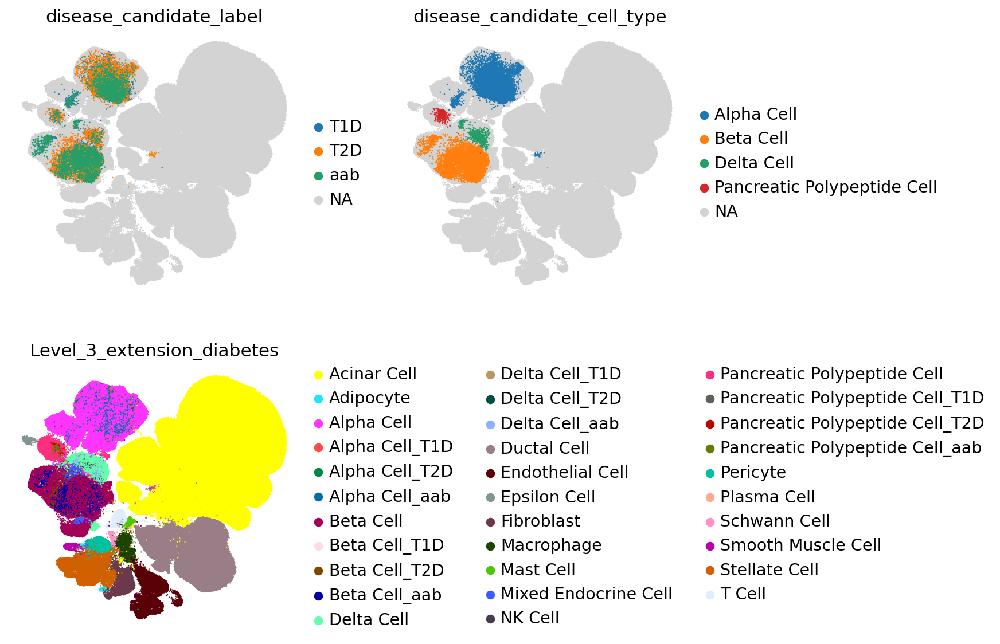

In [32]:
sc.pl.umap(
    adata,
    color=["disease_candidate_label", "disease_candidate_cell_type", "Level_3_extension_diabetes"], frameon=False,
    na_color="lightgrey", ncols=2, size=5
)

In [33]:
adata.obs.head()

,barcode,Dataset,ID,sample_id,donor_id,alignment_software,assay_ontology_term_id,institute,library_id,library_preparation_batch,library_sequencing_run,Manual_Annotation,cell_enrichment,condition,celltype_all,manner_of_death,reference_genome,sample_collection_method,sample_source,sampled_site_condition,samples,sex,sex--cell_ontology_term_id,suspension_type,technology,tissue_type,assay,tissue,organism,disease,gene_annotation_version,batch_covar_split,batch_covar_split_donor_id,batch_covariate,info_batch_covariate_split,doublet_score,predicted_doublet,n_genes,total_counts,total_counts_mito,total_counts_ribo,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,log1p_total_counts_ribo,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,pct_counts_mito,pct_counts_ribo,outlier,outlier_mito,outlier_n_genes,outlier_total_counts,Author_Annotation,Cell_Annotation_Merged,Cell_Type_Harmonized,GSE183568_Annotation,GSE198623_Annotation,GSE84133_Annotation,HPAP_Annotation,charite_snRNA_Annotation,espace_Annotation,leiden_1,leiden_2,leiden_3,leiden_3.5,leiden_4,leiden_3_subclustered,leiden_3_subclustered_immune,Annotation_CAP,ANNOTATION_CARLOTTI,annotation_sterr,Annotation_Vandenbempt_Balboa,Level_1,Level_2,Level_3,Level_4,Level_4_refined,Level_4_refined_desc,Level_4_refined_Dataset,Level_4_refined_desc_Dataset,Level_4_refined_QC_sterr,Integration_Levels,acinar_ambient_expression_score,acinar_ambient_high,beta_ambient_expression_score,beta_ambient_high,alpha_ambient_expression_score,alpha_ambient_high,high_ambient_rna,acinar_identity_score,ductal_identity_score,acinar_ductal_axis,high_mt_sterr,low_genes_sterr,low_complexity_sterr,donor_entropy_scaled,donor_entropy_leiden,dataset_entropy_scaled,dataset_entropy_leiden,alpha_identity_score,beta_identity_score,Level_4_redone,cell_states,cell_states_l4,batch_covar_final,ARX_expr,GLIS3_expr,ARX_top10,GLIS3_top10,Field,donor_id_meta,protocol_url,institute_meta,sample_collection_site,sample_collection_relative_time_point,library_id_meta,library_id_repository,author_batch_notes,organism_ontology_term_id,manner_of_death_meta,sample_source_meta,sex_ontology_term_id,sample_collection_method_meta,tissue_type_meta,sampled_site_condition_meta,tissue_ontology_term_id,tissue_free_text,sample_preservation_method,suspension_type_meta,cell_enrichment_meta,cell_viability_percentage,cell_number_loaded,sample_collection_year,assay_ontology_term_id_meta,library_preparation_batch_meta,library_sequencing_run_meta,sequenced_fragment,sequencing_platform,is_primary_data,reference_genome_meta,gene_annotation_version_meta,alignment_software_meta,intron_inclusion,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,development_stage_ontology_term_id,Dataset_meta,DCP_donor_id,DCP_sample_id,Unnamed: 4,sample_id_meta,integration team donor id,filename,project,dataset,donor_id_name,donor_id_description,sample_id_name,sample_id_description,library_id_repository_name,library_id_repository_description,sample_collection_biobank,manner_of_death_string,author_cell_type,cell_type_ontology_term_id,study,orig.ident,short_id,donor_type,region_id,region_name,slice_no,conservation,conservation_name,sample_receiver,method_id,method_name,age,age_unit,sex_meta,mapped_age_bin,BMI,BMI_category,HbA1c,age_from_hsapdv,ID_meta,n_counts,new_qc_passed,doublets,disease_status,_scvi_batch,_scvi_labels,source,Level_4_extension,predictions,prediction_confidence,prediction_uncertainty,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.1,seurat_clusters,RNA_snn_res.0.5,celltype_assignment1,SeuratClusters,celltype_assignment2,nPOD_barcode,CurrentObjLabels,nPOD_ID,nCount_RAW_mtx,nFeature_RAW_mtx,conditionSubtype,CellTypes,rough_cell_annotation,extension_donor_age,extension_donor_BMI,extension_donor_ancestry,extension_batch_tissuesource,extension_seq_modality,extension_severity_score,n_cells,median_n_genes,median_percent_mito,median_scrublet_score,pct_counts_in_

In [34]:
beta_cells = adata[adata.obs['Level_4_extension_diabetes'].str.contains('Beta Cell')]
# mask = (beta_cells.obs.source == 'core') & (beta_cells.obs.high_ambient_rna == True)
# beta_cells = beta_cells[~mask]
# beta_cells.obs['Level_3_extension_diabetes'].value_counts()

In [35]:
beta_cells.obs['high_ambient_rna'] = beta_cells.obs['high_ambient_rna'].astype(str)
beta_cells = beta_cells[beta_cells.obs["high_ambient_rna"] != 'True']

In [36]:
beta_cells.obs.Level_3_extension_diabetes.value_counts()

Level_3_extension_diabetes
Beta Cell        66660
Beta Cell_T2D     3410
Beta Cell_aab     2621
Beta Cell_T1D      396
Name: count, dtype: int64

In [37]:
beta_cells.obs.high_ambient_rna.value_counts()

high_ambient_rna
False    46797
<NA>     26290
Name: count, dtype: int64

In [38]:
# Remove MT, RPL, RPS, HB, LINC, and A[X]-type genes (like A1BG, A2M), similar to epi_pb filtering above

import re

bad_gene_mask = (
    beta_cells.var_names.str.startswith(("MT-", "RPL", "RPS", "HB", "LINC"))
    | beta_cells.var_names.str.match(r"^A[A-Z]\d+(\.\d+)?$")
)

print(f"Genes to be filtered: {len(beta_cells.var_names[bad_gene_mask])}")
print(beta_cells.var_names[bad_gene_mask])

beta_cells = beta_cells[:, ~bad_gene_mask].copy()
print(f"Genes after filtering: {len(beta_cells.var_names)}")

Genes to be filtered: 13302
Index(['AB015752.1', 'AC000032.1', 'AC000036.1', 'AC000050.1', 'AC000058.1',
       'AC000061.1', 'AC000065.1', 'AC000065.2', 'AC000067.1', 'AC000068.1',
       ...
       'RPS6KA6', 'RPS6KB1', 'RPS6KB2', 'RPS6KB2-AS1', 'RPS6KC1', 'RPS6KL1',
       'RPS7', 'RPS8', 'RPS9', 'RPSA'],
      dtype='object', length=13302)
Genes after filtering: 23503


In [39]:
sc.tl.rank_genes_groups(beta_cells, groupby='Level_3_extension_diabetes', method='wilcoxon')
dge_beta_cells_diabetes = pd.DataFrame(beta_cells.uns['rank_genes_groups']['names'])

In [40]:
pd.set_option('display.max_rows', 100)
dge_beta_cells_diabetes.head(99)

,Beta Cell,Beta Cell_T1D,Beta Cell_T2D,Beta Cell_aab
0,KCNMA1,ATP5MPL,H3F3A,C4orf48
1,MEIS2,C4orf48,H3F3B,ATP5MPL
2,AHI1,ATP5MD,GCG,ATP5MD
3,CADM1,H3F3A,PPY,H2AFJ
4,MEG3,H1FX,MTRNR2L12,H3F3B
5,MAML3,KIAA1324,ATP5MD,H2AFZ
6,DPP6,MTDH,SST,C9orf16
7,MALAT1,H2AFY,ATP5MPL,SARS
8,RIMS2,SMIM4,C4orf48,C7orf50
9,MAGI2,SNHG25,CHGB,H3F3A


In [41]:
dge_beta_cells_diabetes[dge_beta_cells_diabetes['Beta Cell_T2D'] == 'PHB']

,Beta Cell,Beta Cell_T1D,Beta Cell_T2D,Beta Cell_aab
63,EXOC4,MTMR7,PHB,MPP6


1. Histone upregulation

→ epigenetic reprogramming

2. ER stress signature

→ core T2D mechanism

3. Endocrine mixing (GCG, SST, PPY)

→ identity loss (VERY important)

4. Loss of ion channel genes

→ impaired insulin secretion

In [42]:
beta_cells[beta_cells.obs.source != 'core'].obs.groupby(['source', 'Level_4_extension']).size().unstack().T.sort_values(by='aab_extension', ascending=False)

source,T1D_extension,T2D_extension,aab_extension
Level_4_extension,,,
Beta Cell: INS_High,476,5525,5164
Beta Cell: Interferon Response,208,1571,1339
Beta Cell: Proliferating,67,854,807
Beta Cell: INS_Low,296,24,679
Beta Cell: Immediate Early Activation,246,1432,664
Beta Cell: High OxPhos,92,558,601
Beta Cell: Oxidative Stress,72,580,434
Beta Cell: ER Stress,74,587,355
Beta Cell: Mature Identity,19,555,131


In [43]:
beta_cells[beta_cells.obs.source != 'core'].obs.groupby(['source', 'Level_4_extension_diabetes']).size().unstack().T.sort_values(by='aab_extension', ascending=False)

source,T1D_extension,T2D_extension,aab_extension
Level_4_extension_diabetes,,,
Beta Cell: INS_High,343,4406,4069
Beta Cell: INS_High_aab,0,0,1095
Beta Cell: Interferon Response,159,1313,971
Beta Cell: Proliferating,67,844,796
Beta Cell: INS_Low,248,15,580
Beta Cell: Immediate Early Activation,204,1226,509
Beta Cell: Interferon Response_aab,0,0,368
Beta Cell: High OxPhos,68,389,336
Beta Cell: Oxidative Stress,40,422,275


In [44]:
alpha_cells = adata[adata.obs['Level_4_extension'].str.contains('Alpha Cell')]

In [45]:
bad_gene_mask_alpha = (
    alpha_cells.var_names.str.startswith(("MT-", "RPL", "RPS", "HB", "LINC"))
    | alpha_cells.var_names.str.match(r"^A[A-Z]\d+(\.\d+)?$")
)

print(f"Genes to be filtered (alpha cells): {len(alpha_cells.var_names[bad_gene_mask_alpha])}")
print(alpha_cells.var_names[bad_gene_mask_alpha])

alpha_cells = alpha_cells[:, ~bad_gene_mask_alpha].copy()
print(f"Genes after filtering (alpha cells): {len(alpha_cells.var_names)}")

Genes to be filtered (alpha cells): 13302
Index(['AB015752.1', 'AC000032.1', 'AC000036.1', 'AC000050.1', 'AC000058.1',
       'AC000061.1', 'AC000065.1', 'AC000065.2', 'AC000067.1', 'AC000068.1',
       ...
       'RPS6KA6', 'RPS6KB1', 'RPS6KB2', 'RPS6KB2-AS1', 'RPS6KC1', 'RPS6KL1',
       'RPS7', 'RPS8', 'RPS9', 'RPSA'],
      dtype='object', length=13302)
Genes after filtering (alpha cells): 23503


In [46]:
alpha_cells.obs['high_ambient_rna'] = alpha_cells.obs['high_ambient_rna'].astype(str)
alpha_cells = alpha_cells[alpha_cells.obs["high_ambient_rna"] != 'True']

In [47]:
alpha_cells.obs.high_ambient_rna.value_counts()


high_ambient_rna
False    51760
<NA>     37871
Name: count, dtype: int64

In [48]:
sc.tl.rank_genes_groups(alpha_cells, groupby='Level_3_extension_diabetes', method='wilcoxon')
dge_alpha_cells_diabetes = pd.DataFrame(alpha_cells.uns['rank_genes_groups']['names'])

In [49]:
dge_alpha_cells_diabetes.head(99)

,Alpha Cell,Alpha Cell_T1D,Alpha Cell_T2D,Alpha Cell_aab
0,TM4SF4,H3F3B,H3F3A,H3F3B
1,ALDH1A1,ATP5MD,H3F3B,ATP5MPL
2,PAPSS2,H3F3A,MTRNR2L12,MTDH
3,SLC30A8,ATP5MPL,C9orf16,H3F3A
4,GLS,SARS,ATP5MD,C4orf48
5,KCNMB2,H2AFZ,H2AFJ,H1FX
6,PDE3B,H2AFJ,C4orf48,ATP5MD
7,TPD52,MTCH1,ATP5MPL,H2AFJ
8,GPC6,MTDH,KIAA1324,H2AFY
9,ERO1B,H2AFY,H2AFZ,MTCH1


In [52]:
pwd

'/workspace/hpca/hpca_downstream/Diabetes_Results'

In [53]:
# There's no shared column between these DataFrames, so merge will fail.
# If the intention is to concatenate these DataFrames (side by side, since gene names from two cell types), use pd.concat with axis=1:
dges = pd.concat([dge_beta_cells_diabetes.head(99), dge_alpha_cells_diabetes.head(99)], axis=1)
dges.to_csv('dge_beta_alpha_candidate_disease_associated_cell_states.csv')
dges.head(100)

,Beta Cell,Beta Cell_T1D,Beta Cell_T2D,Beta Cell_aab,Alpha Cell,Alpha Cell_T1D,Alpha Cell_T2D,Alpha Cell_aab
0,KCNMA1,ATP5MPL,H3F3A,C4orf48,TM4SF4,H3F3B,H3F3A,H3F3B
1,MEIS2,C4orf48,H3F3B,ATP5MPL,ALDH1A1,ATP5MD,H3F3B,ATP5MPL
2,AHI1,ATP5MD,GCG,ATP5MD,PAPSS2,H3F3A,MTRNR2L12,MTDH
3,CADM1,H3F3A,PPY,H2AFJ,SLC30A8,ATP5MPL,C9orf16,H3F3A
4,MEG3,H1FX,MTRNR2L12,H3F3B,GLS,SARS,ATP5MD,C4orf48
5,MAML3,KIAA1324,ATP5MD,H2AFZ,KCNMB2,H2AFZ,H2AFJ,H1FX
6,DPP6,MTDH,SST,C9orf16,PDE3B,H2AFJ,C4orf48,ATP5MD
7,MALAT1,H2AFY,ATP5MPL,SARS,TPD52,MTCH1,ATP5MPL,H2AFJ
8,RIMS2,SMIM4,C4orf48,C7orf50,GPC6,MTDH,KIAA1324,H2AFY
9,MAGI2,SNHG25,CHGB,H3F3A,ERO1B,H2AFY,H2AFZ,MTCH1


In [46]:
import os
os.chdir('workspace/hpca/hpca_downstream/Diabetes_Results/')

In [3]:
adata.obs.Level_3_extension_diabetes.value_counts()

Level_3_extension_diabetes
Acinar Cell                        567390
Ductal Cell                        154862
Alpha Cell                         133726
Beta Cell                          102531
Stellate Cell                       27652
Endothelial Cell                    19530
Delta Cell                          16977
Pancreatic Polypeptide Cell         11310
Fibroblast                           8158
Macrophage                           7088
Mixed Endocrine Cell                 6068
Pericyte                             5453
Alpha Cell_T2D                       4752
T Cell                               3746
Beta Cell_T2D                        3410
Alpha Cell_T1D                       2646
Beta Cell_aab                        2621
Alpha Cell_aab                       1996
Mast Cell                            1355
Smooth Muscle Cell                   1341
Epsilon Cell                          970
Schwann Cell                          967
Adipocyte                             558
Delta C

In [84]:
# import os
# os.chdir('workspace/hpca/hpca_downstream/Diabetes_Results/')
!pwd

/workspace/hpca/hpca_downstream/Diabetes_Results


In [85]:
sc.set_figure_params(dpi_save=100)

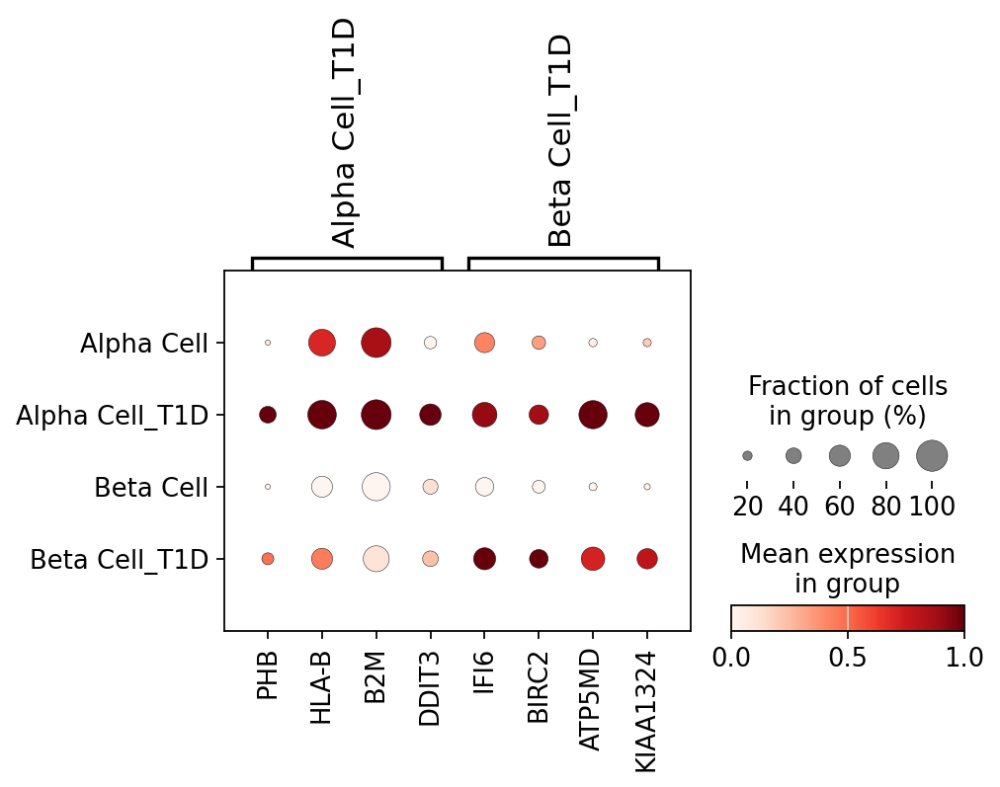

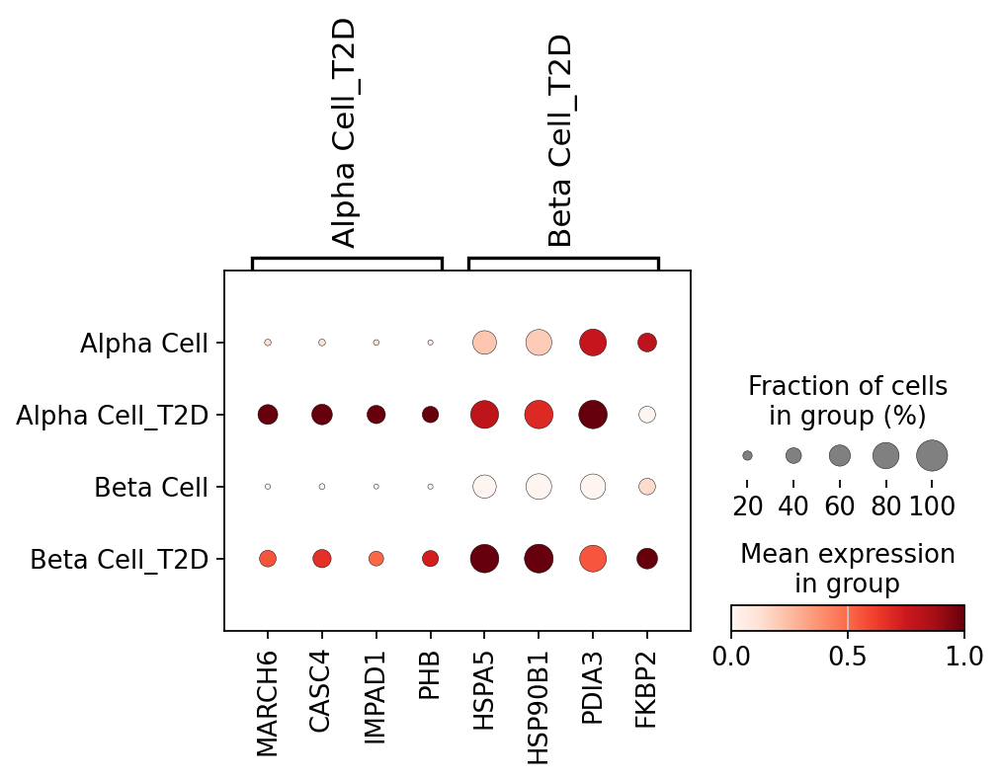

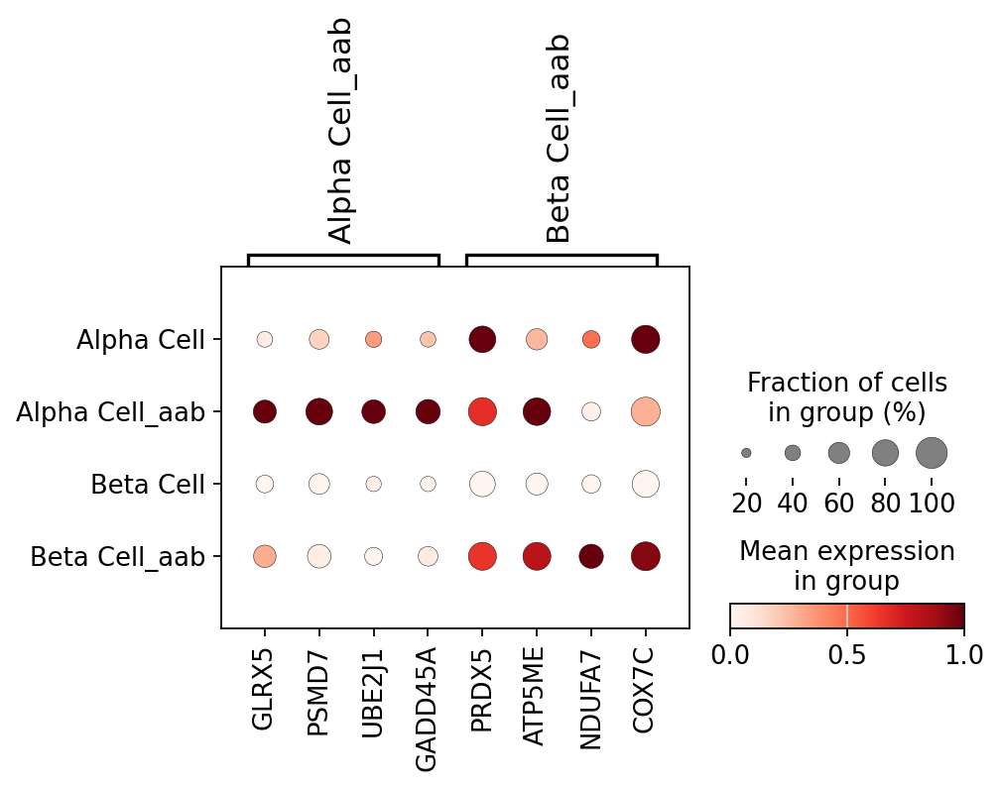

In [86]:
disease_dotplot_genes_t1d = {
    "Alpha Cell_T1D": [
        "PHB",      # mitochondrial stress buffering / oxidative-stress protection
        "HLA-B",    # antigen-presentation / autoimmune inflammatory context
        "B2M",      # MHC-I antigen-presentation component
        "DDIT3",    # ER-stress / integrated stress response
    ],

    "Beta Cell_T1D": [
        "IFI6",     # interferon-response gene
        "BIRC2",    # anti-apoptotic / NF-kB-associated inflammatory survival signaling
        "ATP5MD",    # mitochondrial energy metabolism remodeling
        "KIAA1324", # stress-adaptive ER/endolysosomal remodeling
    ],
}


disease_dotplot_genes_t2d = {
    "Alpha Cell_T2D": [
        "MARCH6",   # ER-associated degradation / proteostasis
        "CASC4",    # ER/Golgi-secretory stress remodeling
        "IMPAD1",   # Golgi/secretory pathway remodeling
        "PHB",      # mitochondrial metabolic-stress buffering
    ],

    "Beta Cell_T2D": [
        "HSPA5",    # unfolded protein response / ER stress
        "HSP90B1",  # ER chaperone / protein-folding stress
        "PDIA3",    # ER protein folding / disulfide isomerase
        "FKBP2",    # ER protein folding / proteostasis maintenance
    ],
}


disease_dotplot_genes_aab = {
    "Alpha Cell_aab": [
        "GLRX5",    # mitochondrial redox / iron-sulfur cluster regulation
        "PSMD7",    # proteasomal remodeling
        "UBE2J1",   # ubiquitin-mediated ER/proteostatic stress response
        "GADD45A",  # DNA-damage / inflammatory stress response
    ],

    "Beta Cell_aab": [
        "PRDX5",    # mitochondrial antioxidant defense
        "ATP5ME",   # ATP synthase remodeling
        "NDUFA7",   # mitochondrial complex I remodeling
        "COX7C",    # oxidative phosphorylation / ETC remodeling
    ],
}
disease_dotplot_genes = {
    **disease_dotplot_genes_t1d,
    **disease_dotplot_genes_t2d,
    **disease_dotplot_genes_aab,
}
# Fix: dotplot expects AnnData (not Series) as input
for disease, dicts_plot in zip(
    ['T1D', 'T2D', 'aab'],
    [disease_dotplot_genes_t1d, disease_dotplot_genes_t2d, disease_dotplot_genes_aab]
):
    # Subset AnnData object, not just value_counts
    celltypes = ['Alpha Cell', 'Beta Cell', f'Alpha Cell_{disease}', f'Beta Cell_{disease}']
    adata_tmp = adata[adata.obs.Level_3_extension_diabetes.isin(celltypes)].copy()
    sc.pl.dotplot(
        adata_tmp,
        var_names=dicts_plot,
        groupby='Level_3_extension_diabetes',
        standard_scale='var', figsize=(6, 3), save=f'{disease}_dotplot.svg'
    )

In [61]:
key = "Level_3_extension_diabetes"

In [62]:
import os
os.chdir('/')

In [63]:
import yaml
with open("workspace/hpca/hpca_downstream/hpca_color_palette.yaml", "r") as f:
    palettes = yaml.safe_load(f)


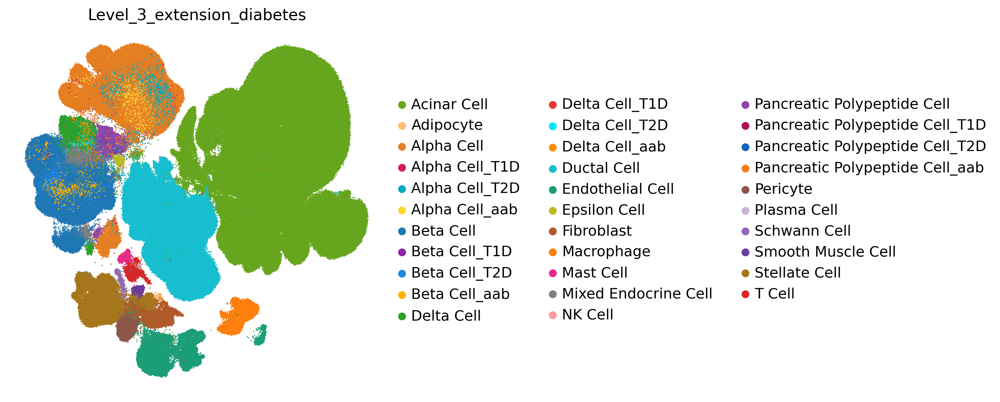

In [14]:


adata.uns[f"{key}_colors"] = [
    palettes[key][cat]
    for cat in adata.obs[key].cat.categories
]

sc.set_figure_params(figsize=(6, 6), frameon=False, dpi=100)
sc.pl.umap(adata, color=key, size=5, sort_order=False)

In [64]:
sc.set_figure_params(dpi_save=300, dpi=300)

In [65]:
os.chdir('/workspace/hpca/hpca_downstream/Diabetes_Results/')

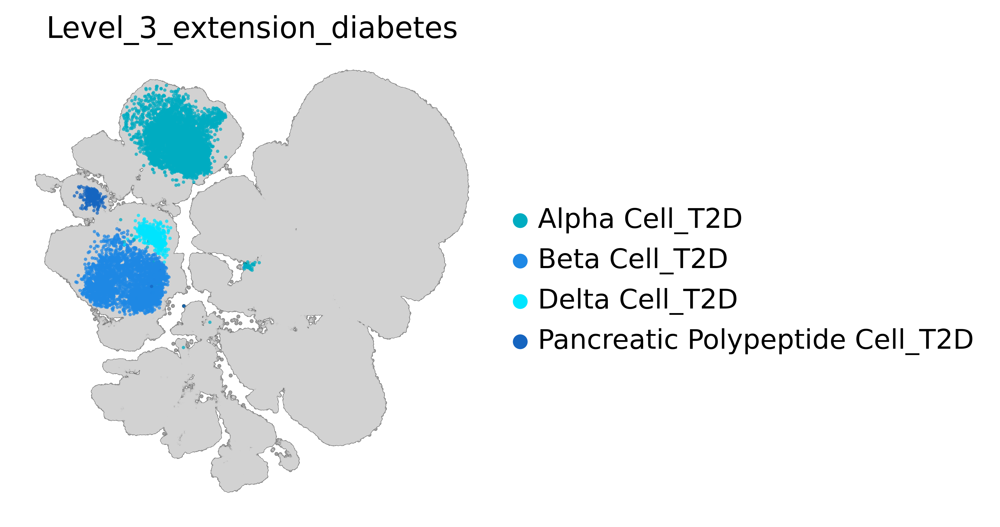

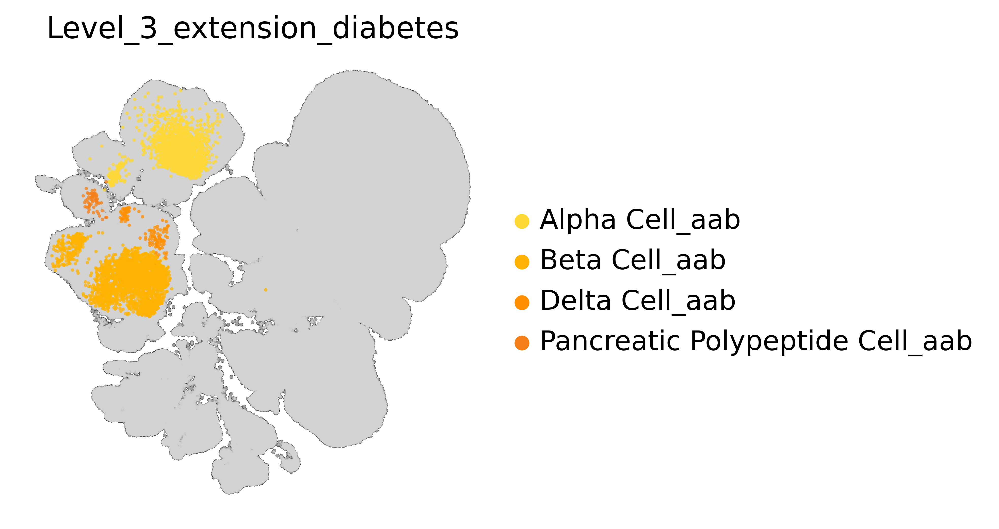

In [66]:
for disease in ['T1D', 'T2D', 'aab']:
    highlight_mask = adata.obs[key].str.contains(disease, na=False)
    groups = adata.obs.loc[highlight_mask, key].unique().tolist()
    # Extract the correct color order
    umap_colors = [palettes['Level_3_extension_diabetes'][cat] for cat in adata.obs[key].cat.categories]
    sc.pl.umap(
        adata,
        color=key,
        size=10,
        sort_order=True,
        groups=groups,
        add_outline=True,
        frameon=False, 
        outline_width=(0.1, 0.05),
        outline_color=['white', 'black'],
        na_color='lightgray',
        alpha=0.75,
        na_in_legend=False,
        palette=umap_colors,
        save=f'Diabetes_Associated_States_{disease}.svg'
    )

In [67]:
# Map current source names to more readable ones
source_rename_dict = {
    'T2D_extension': 'Type 2 Diabetes',
    'T1D_extension': 'Type 1 Diabetes',
    'aab_extension': 'Auto-antibody Positive',
    'core': 'Healthy'
}
adata.obs['Disease'] = adata.obs.source.copy()
adata.obs['Disease'] = adata.obs['source'].replace(source_rename_dict)

In [68]:
adata.obs.Disease.unique()

['Healthy', 'Type 1 Diabetes', 'Type 2 Diabetes', 'Auto-antibody Positive']
Categories (4, object): ['Type 1 Diabetes', 'Type 2 Diabetes', 'Auto-antibody Positive', 'Healthy']

In [69]:
diabetes_status_palette = {
    "Healthy": "#BDBDBD",
    "Type 1 Diabetes": "#D81B60",
    "Type 2 Diabetes": "#1E88E5",
    "Auto-antibody Positive": "#FFB300",
}

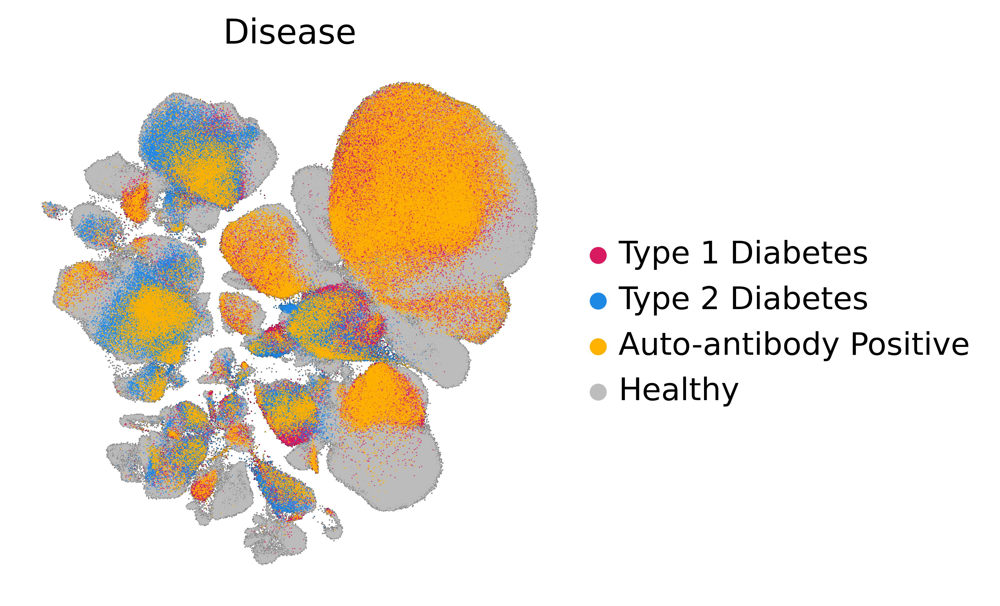

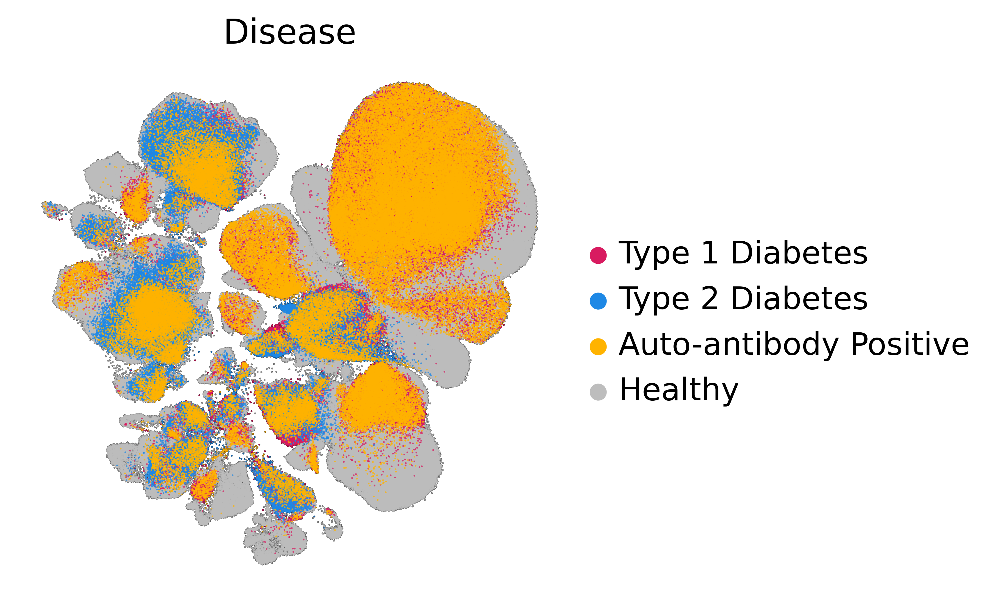

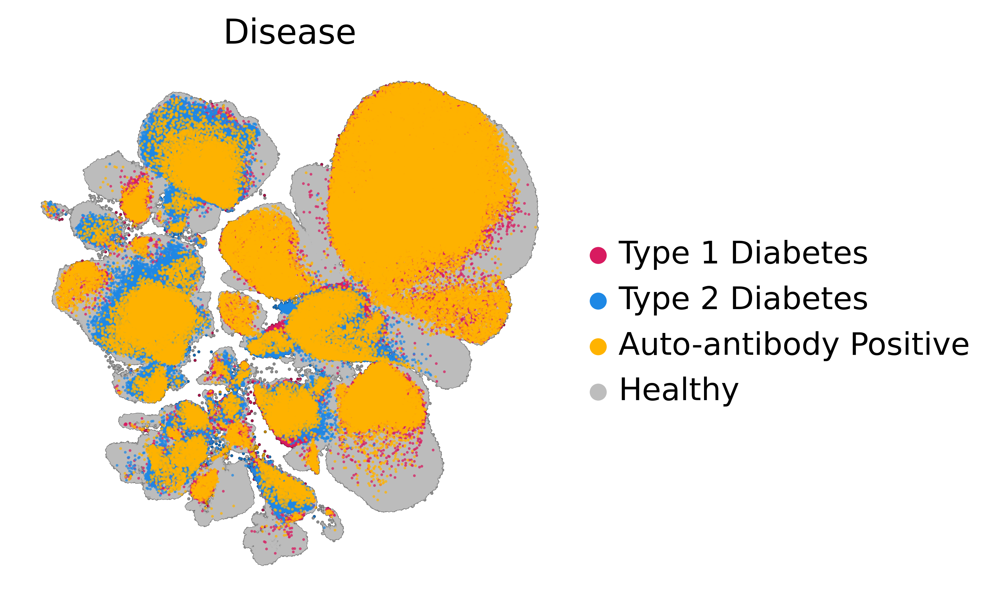

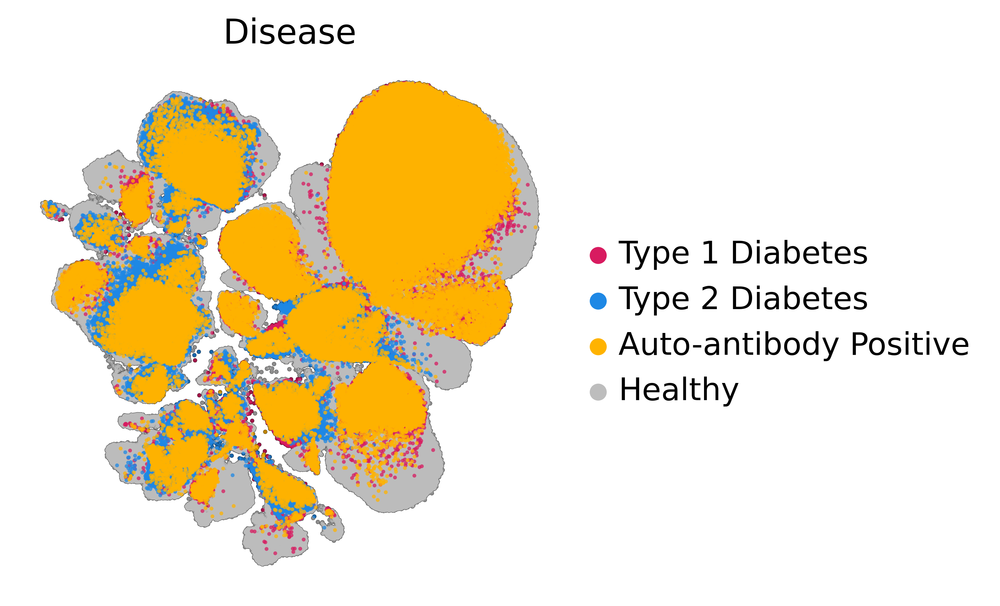

In [70]:
status_key = "Disease"  # replace with your actual adata.obs column

adata.obs[status_key] = adata.obs[status_key].astype("category")

adata.uns[f"{status_key}_colors"] = [
    diabetes_status_palette[cat]
    for cat in adata.obs[status_key].cat.categories
]

for size in [1, 2, 5, 10]:
    sc.pl.umap(
        adata,
        color='Disease', alpha=0.75,
        size=size,
        sort_order=False,
        add_outline=True,
        frameon=False, 
        outline_width=(0.1, 0.05),
        outline_color=['white', 'black'],
        na_color='lightgray',
        na_in_legend=False,
        save=f'Disease_Mapping_size{size}.svg'
    )

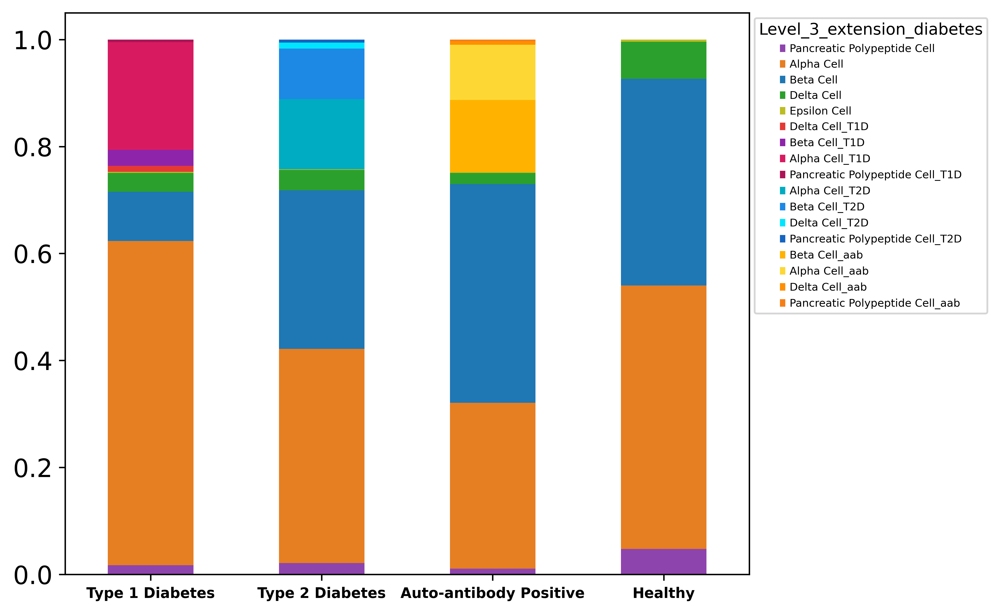

In [71]:

level3_palette = palettes['Level_3_extension_diabetes']

# Calculate the counts (or proportions) of Level_3_extension_diabetes within each Disease
level3_by_disease = (
    adata[adata.obs.Level_3_extension_diabetes.str.contains('Beta|Alpha|Delta|Epsilon|Pancreatic')].obs.groupby(['Disease', 'Level_3_extension_diabetes'])
    .size()
    .unstack(fill_value=0)
)

# Arrange columns to match the palette order for consistency
palette_keys = [k for k in level3_palette.keys() if k in level3_by_disease.columns]
level3_by_disease = level3_by_disease[palette_keys]

# Restrict to Type 2 Diabetes samples only if required
t2d_level3_counts = adata.obs[adata.obs["Disease"] == "Type 2 Diabetes"]["Level_3_extension_diabetes"].value_counts()
t2d_level3_props = t2d_level3_counts / t2d_level3_counts.sum()
# Ensure plotting order matches palette
t2d_level3_props = t2d_level3_props.reindex(palette_keys).fillna(0)

# Stacked barplot for all Disease groups (endocrine classes per disease)
fig, ax = plt.subplots(figsize=(8, 5))
(level3_by_disease.div(level3_by_disease.sum(axis=1), axis=0)
 .plot(
    kind="bar", 
    stacked=True, 
    ax=ax, 
    color=[level3_palette[k] for k in level3_by_disease.columns]
 ))
ax.set_ylabel("")
ax.set_xlabel("", fontweight='bold')
ax.tick_params(axis='x', labelsize=8)
for label in ax.get_xticklabels():
    label.set_fontweight('bold')
ax.set_title("")
legend = ax.legend(title="Level_3_extension_diabetes", bbox_to_anchor=(1, 1), fontsize=6, title_fontsize=9)
ax.grid(False)
ax.xaxis.set_tick_params(rotation=0)  # <-- Make y-tick labels flat (horizontal)
plt.tight_layout()
plt.show()
fig.savefig('level3_by_disease.svg', format='svg', dpi=300)
plt.close(fig)

In [72]:
adata.obs['Level_4_extension_diabetes_simplified'] = adata.obs.Level_4_extension_diabetes.copy()
adata.obs.Level_4_extension_diabetes_simplified = np.where(adata.obs.Level_3_extension_diabetes.str.contains('T1D|T2D|aab'), adata.obs.Level_3_extension_diabetes, adata.obs.Level_4_extension_diabetes)

In [73]:
#make a df of all unique methuman columns with column name as the methuman and rows as unique values
interesting_cols = ['Dataset', 'suspension_type', 'Level_3_extension_diabetes','Level_4_extension_diabetes_simplified']
methuman= {}
for i in interesting_cols:
    methuman[i] = adata.obs[i].unique()
methuman_df = pd.DataFrame.from_dict(methuman, orient='index').T
methuman_df.to_csv('methuman_df.csv', index=False)


In [75]:
adata.obs.Level_3_extension_diabetes.value_counts()

Level_3_extension_diabetes
Acinar Cell                        567390
Ductal Cell                        154862
Alpha Cell                         133726
Beta Cell                          102531
Stellate Cell                       27652
Endothelial Cell                    19530
Delta Cell                          16977
Pancreatic Polypeptide Cell         11310
Fibroblast                           8158
Macrophage                           7088
Mixed Endocrine Cell                 6068
Pericyte                             5453
Alpha Cell_T2D                       4752
T Cell                               3746
Beta Cell_T2D                        3410
Alpha Cell_T1D                       2646
Beta Cell_aab                        2621
Alpha Cell_aab                       1996
Mast Cell                            1355
Smooth Muscle Cell                   1341
Epsilon Cell                          970
Schwann Cell                          967
Adipocyte                             558
Delta C

In [76]:
adata[adata.obs.Level_3_extension_diabetes.str.contains('T1D|T2D|aab')].obs.Level_3_extension_diabetes.value_counts()

Level_3_extension_diabetes
Alpha Cell_T2D                     4752
Beta Cell_T2D                      3410
Alpha Cell_T1D                     2646
Beta Cell_aab                      2621
Alpha Cell_aab                     1996
Delta Cell_T2D                      407
Beta Cell_T1D                       396
Pancreatic Polypeptide Cell_T2D     205
Delta Cell_T1D                      146
Delta Cell_aab                      125
Pancreatic Polypeptide Cell_aab      63
Pancreatic Polypeptide Cell_T1D      62
Name: count, dtype: int64

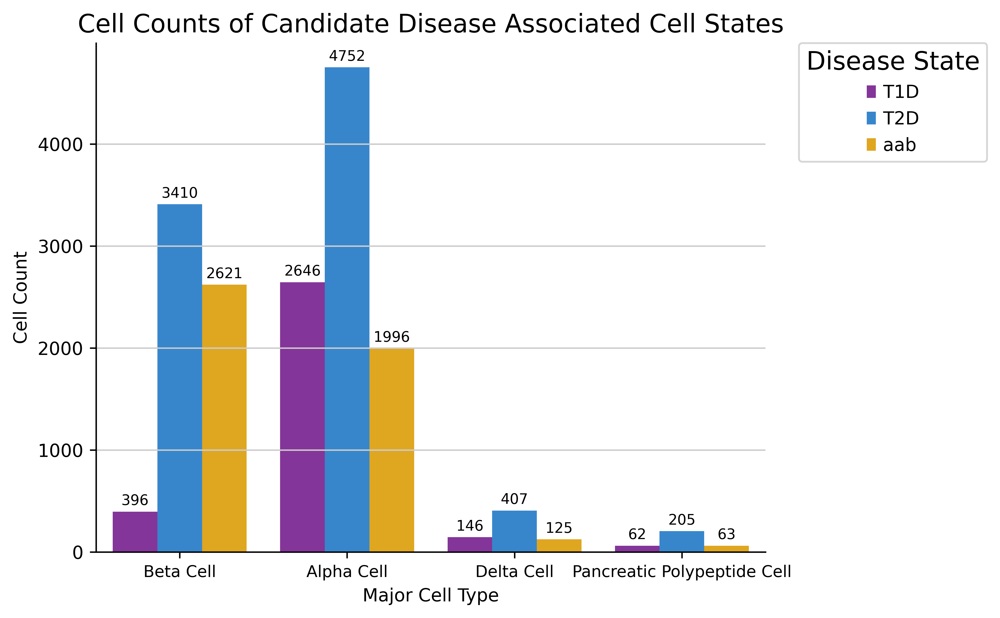

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns

# Use the already computed counts from cell 109
cell_counts = adata[adata.obs.Level_3_extension_diabetes.str.contains('T1D|T2D|aab')].obs.Level_3_extension_diabetes.value_counts()

# Extract major cell type and disease state suffix
bar_data = []
for label, count in cell_counts.items():
    # Only process the specific set from your list
    if label.endswith(("_T1D", "_T2D", "_aab")):
        if label.startswith("Pancreatic Polypeptide Cell"):
            base = "Pancreatic Polypeptide Cell"
        elif label.startswith("Alpha Cell"):
            base = "Alpha Cell"
        elif label.startswith("Beta Cell"):
            base = "Beta Cell"
        elif label.startswith("Delta Cell"):
            base = "Delta Cell"
        else:
            continue  # skip unknowns
        suffix = label.replace(base, "")
        # Store full label as well for coloring
        bar_data.append({
            "Major Cell Type": base, 
            "Disease State": suffix.replace("_", ""), 
            "Cell Count": count,
            "Full Disease State Label": label
        })

import pandas as pd
bar_df = pd.DataFrame(bar_data)

# Sort for nice consistent plotting order
major_order = ["Beta Cell", "Alpha Cell", "Delta Cell", "Pancreatic Polypeptide Cell"]
state_order = ["T1D", "T2D", "aab"]

# Build color palette from palettes['Level_3_extension_diabetes']
# Map Disease State to full key, so we know the proper color
# We'll set the palette for the hue as a dict using state values mapped to palette
palette_vals = {}
for state in state_order:
    # Find unique label for each major cell type+state
    for base in major_order:
        label = base + f"_{state}"
        if label in palettes['Level_3_extension_diabetes']:
            palette_vals[state] = palettes['Level_3_extension_diabetes'][label]
            break  # Take the first found (should be consistent)

plt.figure(figsize=(8,5), dpi=300)
ax = sns.barplot(
    data=bar_df,
    x="Major Cell Type",
    y="Cell Count",
    hue="Disease State",
    order=major_order,
    hue_order=state_order,
    palette=palette_vals
)
plt.title("Cell Counts of Candidate Disease Associated Cell States")
plt.ylabel("Cell Count", fontsize=10)
plt.xlabel("Major Cell Type", fontsize=10)
plt.xticks(fontsize=9, rotation=0)
plt.yticks(fontsize=10)

# Put legend outside
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, title="Disease State", fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

sns.despine()
plt.tight_layout()

# Add numbers on top of bars
for p in ax.patches:
    height = p.get_height()
    if not pd.isna(height) and height > 0:
        ax.annotate(
            f'{int(height)}',
            (p.get_x() + p.get_width() / 2., height),
            ha='center',
            va='bottom',
            fontsize=8,
            xytext=(0, 2),
            textcoords='offset points'
        )

plt.show()

In [135]:
pwd

'/workspace/hpca/hpca_downstream/Diabetes_Results'